# Computational Imaging: Physics and Algorithms (2/3/6.C27 2/3/6.C67)
# PSET 6: Compressive Sensing

Posted: Monday, Oct. 30th, '23

Due: Monday, Nov. 6th, '23

In this excercise, we will reproduce the demo shown in the lecture and use simple examples to appreciate the beauty of compressive sensing. There are off-the-shelf packages or functions (e.g., <code>pyproximal</code>) that can make the entire process in one line of code and give you the best performance. We encourage people to have a try, but in this excercise, we will only implement naive methods that can help us to build the intuition.

### IMPORTANT
1. You should only modify this <code>.ipynb</code> file within the <code>##### YOUR CODE/ANSWER HERE #####</code> block to avoid possible bugs. 1-3 lines of code should be enough for most of the <code>'\__FILL\__'</code>.
2. This also means you don't have to install other packages to finish your code. You are not allowed to use packages that are not listed in the notebook.
3. Run the code locally or in GOOGLE COLAB and save the notebook as a <code>.pdf</code> file with outputs for all cells. Then merge your answers to the other problems (problem 3 and 4 in PSET 5) in this <code>.pdf</code> file and submit it to CANVAS. We will only accept a single <code>.pdf</code> file for this PSET.

In [1]:
# Preparation
# DO NOT CHANGE ANYTHING IN THIS CELL
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pywt
from skimage.data import shepp_logan_phantom

# Plot and compare two 1D signal
def compare_1D_signal(s, s1, legend1, legend='original signal'):
    plt.figure(figsize=(20, 4))
    plt.plot(s, '--', label=legend, linewidth=2)
    plt.plot(s1, 'teal', label=legend1, linewidth=2)
    plt.xlim([0, s1.shape[0]-1])
    plt.legend(fontsize=20, loc='upper right')
    plt.show()

from scipy.sparse.linalg import LinearOperator, cg

def shrinkage(a, kappa):
    return np.clip(a-kappa, a_min=0, a_max=None) - np.clip(-a-kappa, a_min=0, a_max=None)

# 1D TV reconstruction
def tv_recon(b, mask, lam, rho=0.1, alpha=1.5):
    MAX_ITER = 20000
    ABSTOL = 1e-4
    RELTOL = 1e-2

    n = len(mask)
    mask = mask > 0

    # sampling and reconstruction operators
    # FFT and undersample
    def U(v):
        return np.fft.fftshift(np.fft.fft(v))[mask]

    # zero-fill and IFFT
    def U_H(v):
        v_ = np.zeros(mask.shape, v.dtype)
        v_[mask] = v
        return np.fft.ifft(np.fft.fftshift(v_))

    # difference matrix operator
    def D(v):
        return v - np.roll(v, -1)

    def D_H(v):
        return v - np.roll(v, 1)

    def F_matvec(v):
        return U_H(U(v)) + rho * D_H(D(v))

    F = LinearOperator((n,n), matvec=F_matvec, rmatvec=F_matvec)
    x = np.zeros((n,), dtype=b.dtype)
    z = x.copy()
    u = x.copy()

    for k in range(MAX_ITER):
        x, _ = cg(F, U_H(b) + rho * D_H(z - u), maxiter=min(1, k//100), x0 = x)
        z_ = z
        Fx_hat = alpha * D(x) + (1 - alpha) * z_
        z = shrinkage(Fx_hat + u, lam / rho)
        u = u + Fx_hat - z
        r_norm = np.linalg.norm(D(x) - z)
        s_norm = np.linalg.norm(-rho * D_H(z - z_))
        eps_prim = np.sqrt(n) * ABSTOL + RELTOL * max(np.linalg.norm(D(x)), np.linalg.norm(-z))
        eps_dual = np.sqrt(n) * ABSTOL + RELTOL * np.linalg.norm(rho * D_H(u))
        if r_norm < eps_prim and s_norm < eps_dual:
            break
    return x

def tv_recon_2d(b, mask, lam=1.0, rho=1.0, alpha=1.6):
    MAX_ITER = 2000
    ABSTOL = 1e-4
    RELTOL = 1e-2

    n = b.size
    im_dims = ny, nx = mask.shape
    N = ny*nx
    
    # sampling and reconstruction operators
    # FFT and undersample
    def U(v):
        v = np.reshape(v, im_dims)
        Uv = np.fft.fftshift(np.fft.fft2(v))[mask > 0]
        return np.reshape(Uv, (n,))

    # zero-fill and IFFT
    def U_H(v):
        v_ = np.zeros(im_dims, v.dtype)
        v_[mask > 0] = v
        U_Hv = np.fft.ifft2(np.fft.fftshift(v_))
        return np.reshape(U_Hv, (N,))

    # difference matrix operator - 2D TV
    def D(v):
        v = np.reshape(v, im_dims)
        Dv = 2*v - np.roll(v, -1, 0) - np.roll(v, -1, 1)
        return np.reshape(Dv, (N,))
    
    def D_H(v):
        v = np.reshape(v, im_dims)
        D_Hv = 2*v - np.roll(v, 1, 0) - np.roll(v, 1, 1)
        return np.reshape(D_Hv, (N,))

    def F_matvec(v):
        return U_H(U(v)) + rho * D_H(D(v))

    F = LinearOperator((N, N), matvec=F_matvec, rmatvec=F_matvec)
    x = np.zeros((N,))
    z = x.copy()
    u = x.copy()

    for k in range(MAX_ITER):
        x, _ = cg(F, U_H(b) + rho * D_H(z - u), maxiter=k//100, x0=x)
        z_ = z
        Dx_hat = alpha * D(x) + (1 - alpha) * z_
        z = shrinkage(Dx_hat + u, lam / rho)
        u = u + Dx_hat - z
        r_norm = np.linalg.norm(D(x) - z)
        s_norm = np.linalg.norm(rho * D_H(z_ - z))
        eps_prim = np.sqrt(N) * ABSTOL + RELTOL * max(np.linalg.norm(D(x)), np.linalg.norm(-z))
        eps_dual = np.sqrt(N) * ABSTOL + RELTOL * np.linalg.norm(rho * D_H(u))
        if r_norm < eps_prim and s_norm < eps_dual:
            break
    return x
    
# Plot and compare two images
def compare_image(im1, im2, titles):
    plt.figure(figsize=(10, 5))
    plt.subplot(121); plt.imshow(im1, cmap='gray', vmin=0, vmax=255); plt.title(titles[0]); plt.axis("off")
    plt.subplot(122); plt.imshow(im2, cmap='gray', vmin=0, vmax=255); plt.title(titles[1]); plt.axis("off")
    plt.show()

# Plot and compare original image, undersampled image, and reconstructed image
def plot_reconstruction_results(im1, im2, im3):
    plt.figure(figsize=(15, 5))
    plt.subplot(131); plt.imshow(im1, cmap='gray', vmin=0, vmax=255); plt.title('original'); plt.axis("off")
    plt.subplot(132); plt.imshow(im2, cmap='gray', vmin=0, vmax=255); plt.title('undersampled'); plt.axis("off")
    plt.subplot(133); plt.imshow(im3, cmap='gray', vmin=0, vmax=255); plt.title('reconstructed'); plt.axis("off")
    plt.show()

# Transform to wavelet domain
def flat_wavelet_transform2(x):
    # input: image
    # output: image in the wavelet domain
    coeffs = pywt.wavedec2(x, 'sym3')
    x_transform = coeffs[0].reshape(-1)
    for tups in coeffs[1:]:
        for c in tups:
            x_transform = np.concatenate((x_transform, c.reshape(-1)))
    return x_transform

# Inverse transform to original domain
def inverse_flat_wavelet_transform2(x, shape):
    # input: image in the wavelet domain, image shape in the original domain
    # output: image
    shapes = pywt.wavedecn_shapes(shape, 'sym3')
    nx, ny = shapes[0][0], shapes[0][1]
    n = nx * ny
    coeffs = [x[:n].reshape(nx,ny)]
    for _, d in enumerate(shapes[1:]):
        vals=list(d.values())
        nx, ny = vals[0][0], vals[0][1]
        coeffs.append((x[n:n+nx*ny].reshape(nx, ny), x[n+nx*ny:n+2*nx*ny].reshape(nx, ny), x[n+2*nx*ny:n+3*nx*ny].reshape(nx, ny)))
        n += 3*nx*ny
    return pywt.waverec2(coeffs, 'sym3')

def l1_error_function(img1, img2):
    # INPUT:
    # img1 - ground truth image
    # img2 - reconstructed image
    # OUTPUT:
    # l1_error - l1-norm of the difference between img1 and img2
    l1_error = sum(abs(img1.reshape(-1)-img2.reshape(-1)))
    return l1_error

def recover_l1(y, lam):
    # INPUT:
    # y - noisy measurement
    # lam - weight which is the lambda in the formulation
    # OUTPUT:
    # x_l1 - recovered signal
    x_l1 = np.zeros(y.shape)+(y+lam)*(y<-lam)+(y-lam)*(y>lam)
    return x_l1

### 1. Effect of undersampling as an underdetermined linear operator
In this part, we will visualize the process of undersampling in the Fourier domain first, and then we will formulate this as an underdetermined linear problem that we have been seeing since the very beginning of this course.
#### 1.1 Create a 1D sparse signal

In [2]:
# use latex for plotting 
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

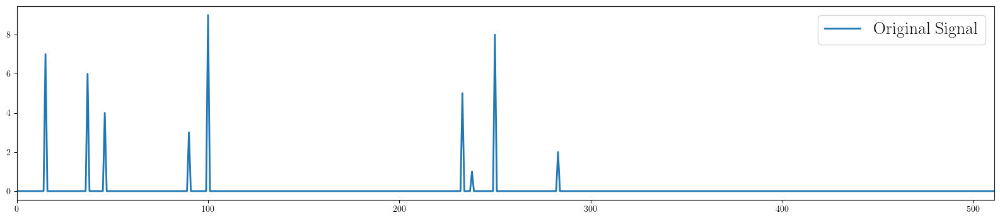

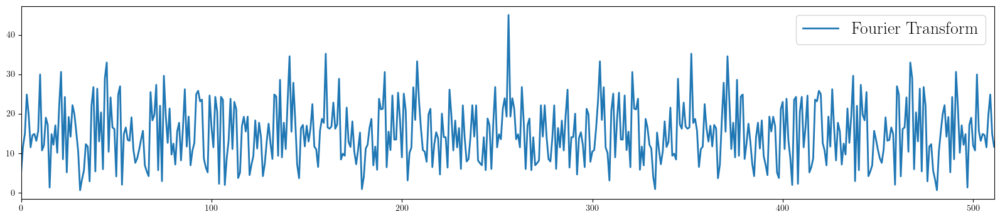

In [55]:
# Generate a sparse signal
def sparse_signal(L, S):
    # INPUT:
    # L - the length of the signal
    # S - sparsity (the number of non-zero elements in the signal with random integer values between 1 and S)
    # OUTPUT:
    # x - sparse signal (x.shape = (L,))
    
    # Note: You might need to use np.random in the following lines.
    # So rerun this cell can cause changes to your future calculations.
    # To avoid this, you can use np.random.seed but this is not required.
    x = np.zeros((L,))

    # select the positions to put the non-zero elements
    np.random.seed(0)
    positions = np.random.choice(L,S,replace=False)

    # select the values of the non-zero elements
    np.random.seed(1)
    x[positions] = np.random.choice(S,S,replace=False)

    return x

# sparse signal
L = 512
S = 10
x = sparse_signal(L, S)
# Fourier transform (FT) of the sparse signal
# Hint: use np.fft.fft and np.fft.fftshift
X = np.fft.fftshift(np.fft.fft(x))

plt.figure(figsize=(20, 4))
plt.plot(x, linewidth=2, label='Original Signal')
plt.xlim([0, x.shape[0]-1])
plt.legend(fontsize=20, loc='upper right')
plt.show()

plt.figure(figsize=(20, 4))
plt.plot(np.abs(X), linewidth=2, label='Fourier Transform')
plt.xlim([0, x.shape[0]-1])
plt.legend(fontsize=20, loc='upper right')
plt.show()

#### 1.2 Effect of undersampling
We will be only using 1/3 samples (sampling ratio <code>R=3</code>) from the Fourier transform, and you should expect the reconstruction with only 1/3 samples is not sufficient.

In [56]:
# sampling ratio
R = 3
def mask_sampling_recon(X, sampling_mask, title):
    # INPUT:
    # X - the FT of the signal
    # sampling_mask - a mask where 1/R elements are 1 and the other elements are 0
    # title - a string
    # OUTPUT:
    # x_recon - reconstructed signal using only 1/R sample in the Fourier domain

    # given the FT data X and the mask, using inverse FT (IFT) of the undersampling data to get x_recon
    x_recon = np.fft.ifft(np.fft.ifftshift(X*sampling_mask))
    samples = np.argwhere(sampling_mask > 0)
    no_samples = np.argwhere(sampling_mask == 0)

    plt.figure(figsize=(20, 4))
    plt.plot(np.abs(X), label='$|F(\\nu)|$', linewidth=2)
    plt.plot(samples, np.abs(X)[samples], 'r.', label=title+' samples', markersize=10)
    plt.plot(no_samples, np.abs(X)[no_samples], 'g.', label='discarded samples', markersize=10)
    plt.xlim([0, X.shape[0]-1])
    plt.legend(fontsize=20, loc='upper right')
    plt.show()

    compare_1D_signal(x, np.abs(x_recon), 'reconstruction')

    return x_recon

In the following, we will consider (1) uniform sampling mask, where samples are equally spaced, (2) center sampling mask, where samples are from the centeral part of the FT, and (3) random sampling mask, where samples are randomly chosen. Implement these masks and write down your observations and reasonings for the reconstructions.

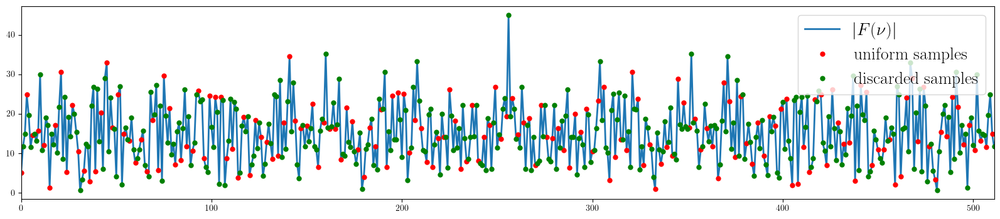

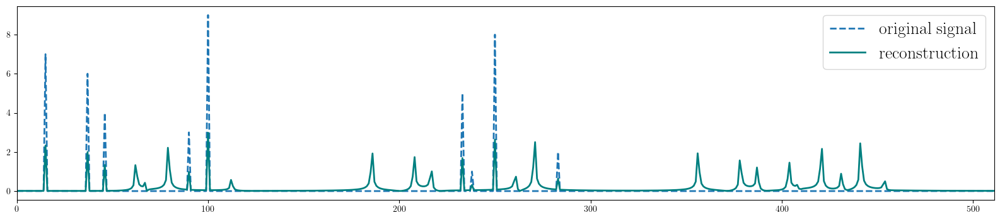

0.333984375


In [83]:
# uniform sampling mask
sampling_mask_uniform = np.zeros(X.shape)
positions = np.arange(0, X.shape[0], R)
sampling_mask_uniform[positions] = 1
_ = mask_sampling_recon(X, sampling_mask_uniform, 'uniform')

print(len(positions)/X.shape[0])

# Observations:
# 1. There are peaks where we expect them to be in the reconstructed signal, but the peaks are not as sharp as the original signal.
# 2. There are other peaks that did not exist in the original signal popping up.
# 3. Overall the reconstructed signal is sparse, but not as sparse as the original signal and the reconstruction quality is much lower.

# Reasoning:
# 1. This could be attributed to the fact that we are systematically removing certain frequencies by our sampling method, which in turn reduces the overall magnitude of the fourier of the signal.
# 2. This could be attributed to aliasing effects, which is also a result of the systematic removal of certain frequencies.
# 3. This is probably a combination of the first two reasons proposed.

In [58]:
X.shape

(512,)

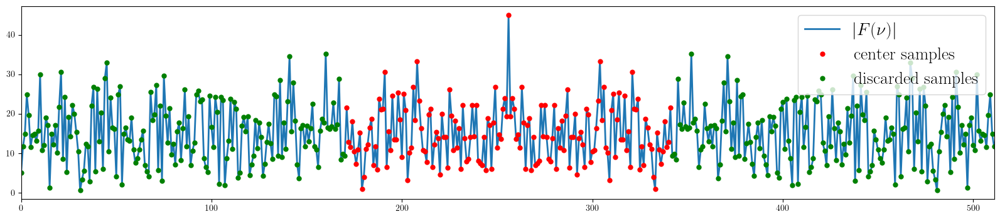

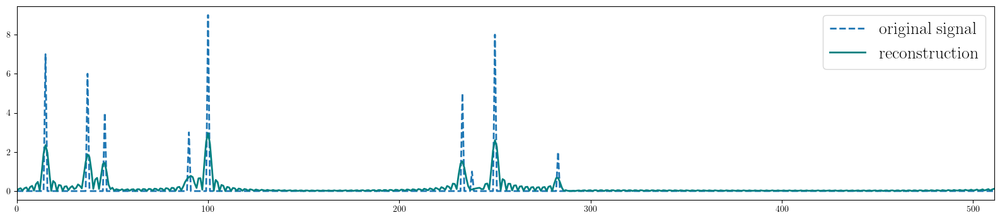

0.333984375


In [84]:
# center sampling mask
sampling_mask_center = np.zeros(X.shape)
num_samples = X.shape[0]//R
positions = np.arange(X.shape[0]//2-num_samples//2, X.shape[0]//2+num_samples//2+1)
sampling_mask_center[positions] = 1
_ = mask_sampling_recon(X, sampling_mask_center, 'center')

print(len(positions)/X.shape[0])


# Observations:
# 1. The peaks are now more rounded compared to the uniform sampling case.
# 2. The peaks are now more sparse and higher reconstruction quality than in the uniform sampling case.
# 3. There are now higher frequency artifacts in the reconstructed signal not present in the original signal and not present in the uniform sampling case.

# Reasoning:
# 1. This is probably related to the fact that we are multiplying the fourier of the signal with the rect function which is basically like convolving the original signal with the sinc function in the spatial domain. This could partially explain why we see more rounded signals.
# 2. This could be due to the fact that the masked fourier signal is basically just a low-passed versioin of the originial signal, which explains why the peaks are more sparse and the reconstruction quality is higher, and this also explains why the peaks are lower in magnitude.
# 3. This is also probably attributed to the same reason proposed in 1.

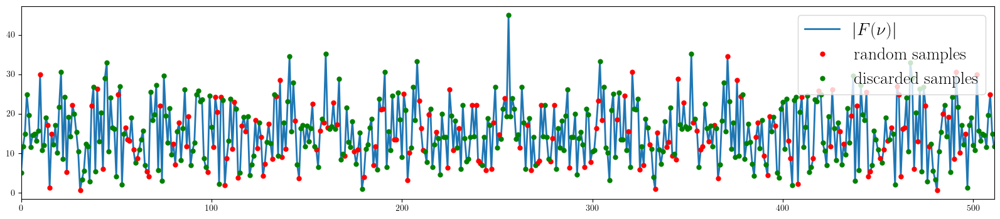

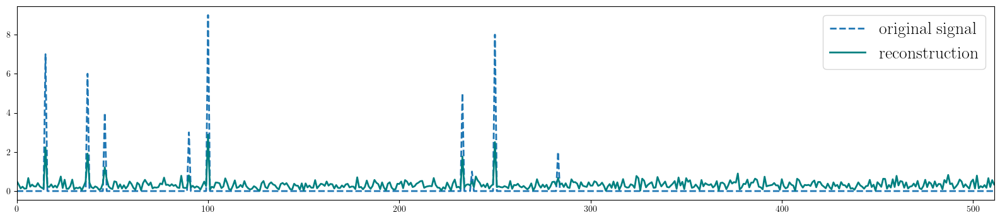

0.33203125


In [85]:
# random sampling mask
np.random.seed(3)
positions = np.random.choice(X.shape[0], X.shape[0]//R, replace=False)
sampling_mask_random = np.zeros(X.shape)
sampling_mask_random[positions] = 1
x_recon = mask_sampling_recon(X, sampling_mask_random, 'random')

print(len(positions)/X.shape[0])

# Observations:
# 1. The reconstructed signal is far more noisy than the originial signal.
# 2. The peaks are not as high as the original signal, though they are visible.

# Reasoning:
# 1. This is a result of the fact that we are effectively making the fourier signal sparse by randomly removing certain frequencies, which in turn makes the reconstructed signal more dense.
# 2. This is just a result of the fact that we are undersampling, which causes us to lose magnitude in the reconstructed signal since the frequency magnitudes are now effectively lower.

#### 1.3 Undersampling is an underdetermined linear operator
Now, we will formulate the above undersampling scheme as an underdetermined linear operator. Recall what we have done so far on the original signal <code>x</code>: (1) FT, (2) FFT shift, (3) undersampling, (4) FFT shift, (5) IFT. We can write each step as a linear operator (a matrix), and if we cascade all the operators together, we can get the equivalent overall linear operator.

Note that, the FT we use in programming is actually Discrete/Inverse Discrete FT (DFT/IDFT). I.e., instead of having a continuous function $f(x)$ and its FT $F(\nu)$ with
$$
F(\nu) = \int_{-\infty}^{\infty}f(x)e^{-i2\pi\nu x}\text{d}x,\quad
f(x) = \int_{-\infty}^{\infty}F(\nu)e^{+i2\pi\nu x}\text{d}\nu,
$$
we are transforming between a sequence $\{x_n\}_{n=0}^{N-1}$ and another sequence in the Fourier domain $\{X_k\}_{k=0}^{N-1}$ with
$$
X_k=\sum_{n=0}^{N-1}x_ne^{-i\frac{2\pi}{N}kn},\quad
x_n = \frac{1}{N}\sum_{k=0}^{N-1}X_k e^{+i\frac{2\pi}{N}kn}.
$$
Therefore, if we rewrite this in a matrix form, DFT is a linear operator
$$
\bm{X} = \text{DFT}\cdot\bm{x},\quad
\bm{x} = \text{IDFT}\cdot\bm{X}
$$
with
$$
\text{DFT}=\left[
\begin{matrix}
e^{-i\frac{2\pi}{N}\cdot 0\cdot 0} & e^{-i\frac{2\pi}{N}\cdot 0\cdot 1} & \cdots &e^{-i\frac{2\pi}{N}\cdot 0\cdot (N-1)}\\
e^{-i\frac{2\pi}{N}\cdot 1\cdot 0} & e^{-i\frac{2\pi}{N}\cdot 1\cdot 1} & \cdots &e^{-i\frac{2\pi}{N}\cdot 1\cdot (N-1)}\\
\vdots & \vdots&\ddots&\vdots \\
e^{-i\frac{2\pi}{N}\cdot (N-1)\cdot 0} & e^{-i\frac{2\pi}{N}\cdot (N-1)\cdot 1} & \cdots &e^{-i\frac{2\pi}{N}\cdot (N-1)\cdot (N-1)}\\
\end{matrix}
\right],\quad
\text{IDFT}=\frac{1}{N}\left[
\begin{matrix}
e^{+i\frac{2\pi}{N}\cdot 0\cdot 0} & e^{+i\frac{2\pi}{N}\cdot 0\cdot 1} & \cdots &e^{+i\frac{2\pi}{N}\cdot 0\cdot (N-1)}\\
e^{+i\frac{2\pi}{N}\cdot 1\cdot 0} & e^{+i\frac{2\pi}{N}\cdot 1\cdot 1} & \cdots &e^{+i\frac{2\pi}{N}\cdot 1\cdot (N-1)}\\
\vdots & \vdots&\ddots&\vdots \\
e^{+i\frac{2\pi}{N}\cdot (N-1)\cdot 0} & e^{+i\frac{2\pi}{N}\cdot (N-1)\cdot 1} & \cdots &e^{+i\frac{2\pi}{N}\cdot (N-1)\cdot (N-1)}\\
\end{matrix}
\right].
$$

In [64]:
# DFT matrix implementation using the formula above
def dft_matrix(N):
    # INPUT:
    # N - the length of the sequence
    # OUTPUT:
    # M - DFT matrix of size N*N
    M = np.zeros((N, N), dtype=np.complex128)
    for k in range(N):
        for n in range(N):
            M[k,n] = np.exp(-2j*np.pi*k*n/N)
    return M

# IDFT matrix implementation using the formula above
def idft_matrix(N):
    # INPUT:
    # N - the length of the sequence
    # OUTPUT:
    # M - IDFT matrix of size N*N
    M = np.zeros((N, N), dtype=np.complex128)
    for k in range(N):
        for n in range(N):
            M[k,n] = np.exp(2j*np.pi*k*n/N) / N
    return M

# DFT shift matrix
def dftshift_matrix(N):
    # INPUT:
    # N - the length of the sequence
    # OUTPUT:
    # M - matrix that is equivalent to performing DFT shift of size N*N
    # Hint: you may need to use np.block
    # Check if N is even
    if N % 2 != 0:
        raise ValueError('N must be even.')
        # M = np.block([
        #     [np.zeros((N//2+1,N//2+1)), np.eye(N//2+1)],
        #     [np.eye(N//2), np.zeros((N//2, N//2))]
        # ])
    else:
        M = np.block([
            [np.zeros((N//2,N//2)), np.eye(N//2)],
            [np.eye(N//2), np.zeros((N//2, N//2))]
        ])
    
    return M

# multiplying all 5 matrices together
# Hint 1: The undersampling operator is a diagonal matrix.
# Hint 2: All 5 matrices have dimensions N*N.
# Hint 3: For simplicity, this is not exactly the same as the Ax=b model where you have A of size M*N.
# But they are equivalent since the undersampling operator has zeros everywhere.
N = 512
undersampling_operator = np.zeros((N, N))
np.random.seed(3)
undersampling_positions = np.random.choice(N, N//R, replace=False)
undersampling_operator[undersampling_positions, undersampling_positions] = 1
sampling_matrix_random = dft_matrix(N) @ dftshift_matrix(N) @ undersampling_operator @ dftshift_matrix(N) @ idft_matrix(N)

Let's do a quick sanity check to verfify if this <code>sampling_matrix_random</code> is doing the correct thing:

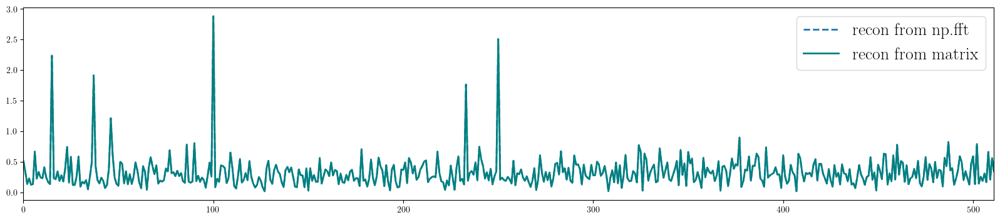

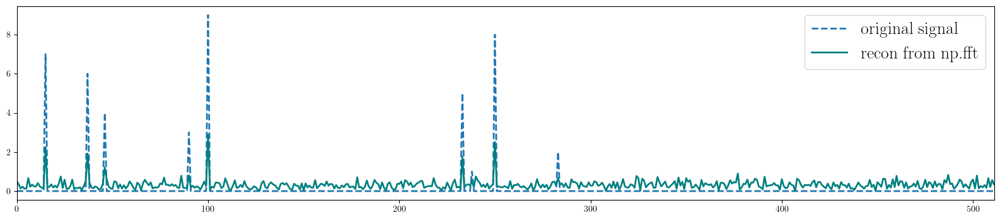

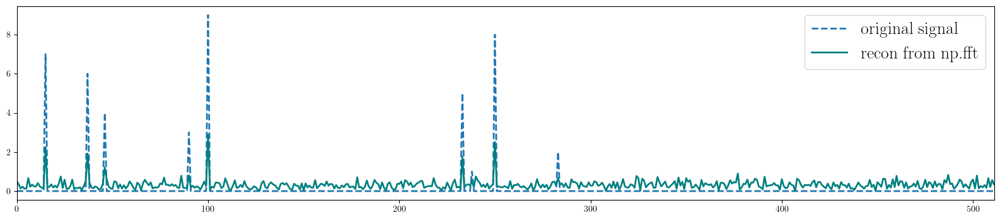

In [86]:
# you should see two signals from two implementation methods overlap
x_recon_from_matrix = sampling_matrix_random @ x
compare_1D_signal(np.abs(x_recon), np.abs(x_recon_from_matrix), 'recon from matrix', legend='recon from np.fft')
compare_1D_signal(x, np.abs(x_recon), 'recon from np.fft', legend='original signal')
compare_1D_signal(x, np.abs(x_recon_from_matrix), 'recon from np.fft', legend='original signal')

### 2. 1D sparse signal recovery in underdetermined problem
We will explore the use of $\ell_1$, $\ell_2$, and total variation (TV) as three regularization term for recovering the signal in the first section.
#### 2.1 Regularization ($\ell_2$ and $\ell_1$)
The objective function of the $\ell_p (p=1,2)$ regularization is of the form
$$
\min_{x} \Vert Ax-b\Vert_2^2+\lambda \Vert x\Vert_p^p.
$$

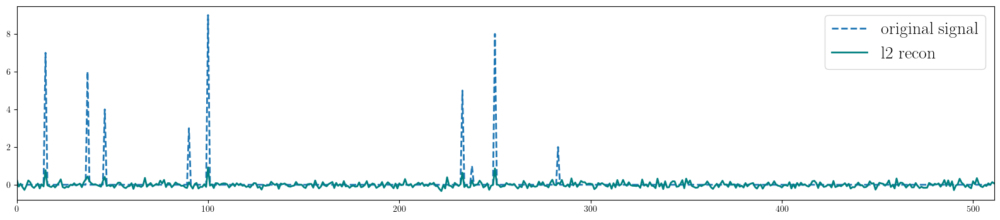

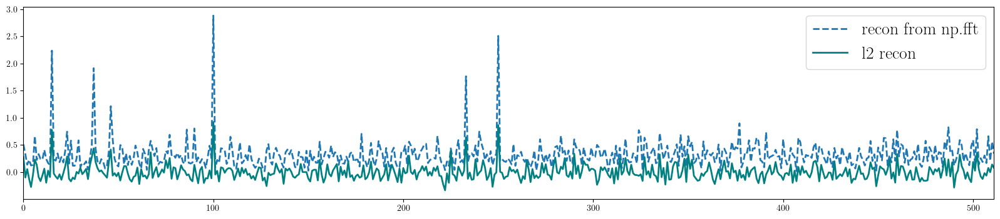

In [97]:
from scipy.optimize import minimize

def lp_penalty_solver(A, b, lam, lp):
    def objective_function(x):
        if lp == 'l1':
            # Hint: use np.linalg.norm to calculate |Ax-b|_2^2+lam_*|x|_1
            return np.linalg.norm(A @ x - b, ord=2)**2 + lam * np.linalg.norm(x, ord=1)
        if lp == 'l2':
            # Hint: use np.linalg.norm to calculate |Ax-b|_2^2+lam*|x|_2^2
            return np.linalg.norm(A @ x - b, ord=2)**2 + lam * np.linalg.norm(x, ord=2)**2

    x0 = np.zeros(A.shape[1])
    result = minimize(objective_function, x0, method='L-BFGS-B')

    return result.x

# find a lam that gives you a resonable reconstruction

recon = lp_penalty_solver(sampling_matrix_random, np.abs(x_recon), lam=0.1, lp='l2')
compare_1D_signal(x, recon, 'l2 recon')
compare_1D_signal(np.abs(x_recon), recon, 'l2 recon', legend='recon from np.fft')

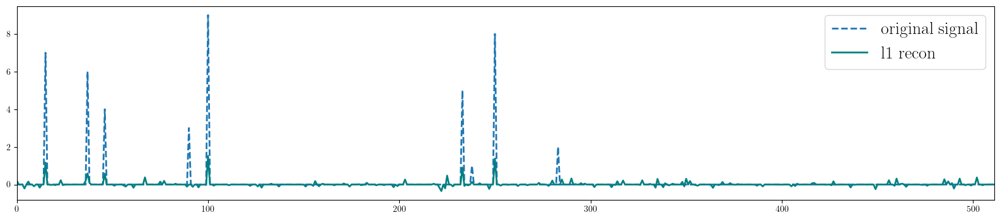

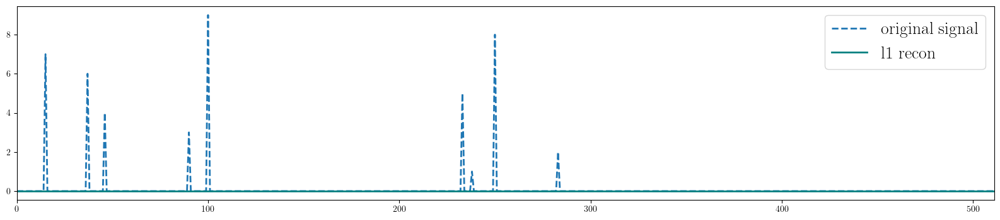

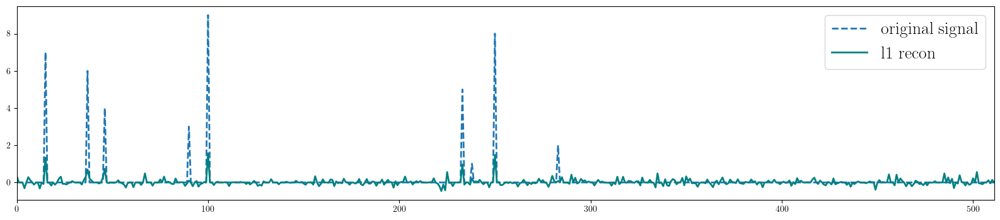

In [105]:
# choose 3 values of lam to show a success case, and two faliure cases where lam is too large or too small
lam_good = 0.15
lam_low = 0.01
lam_high = 10
recon = lp_penalty_solver(sampling_matrix_random, np.abs(x_recon), lam=lam_good, lp='l1')
compare_1D_signal(x, recon, 'l1 recon')
recon = lp_penalty_solver(sampling_matrix_random, np.abs(x_recon), lam=lam_high, lp='l1')
compare_1D_signal(x, recon, 'l1 recon')
recon = lp_penalty_solver(sampling_matrix_random, np.abs(x_recon), lam=lam_low, lp='l1')
compare_1D_signal(x, recon, 'l1 recon')

In [ ]:
# Observations and Explanations:
# 1. The l1 reconstruction looks cleaner compared to the l2 reconstruction from the previous part.
# 2. When a small lambda is used, the reconstruction is more noisy because there is less of a penalty in the objective function for when effectively the sum of the absolute values of the x values is large.
# 3. When a large lambda is used, the reconstruction is far too sparse because there is too much of a penalty in the objective function for when effectively the sum of the absolute values of the x values is large.
# 4. When a reasonable lambda is used, the reconstruction is relatively clean and sparse, though the magnitude of the reconstruction is not as close to the original signal as we would like.

#### 2.2 Regularization (TV)

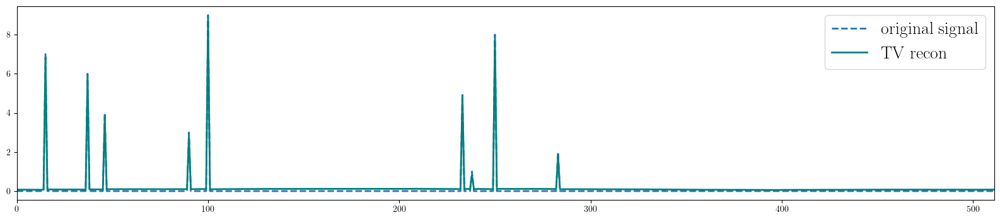

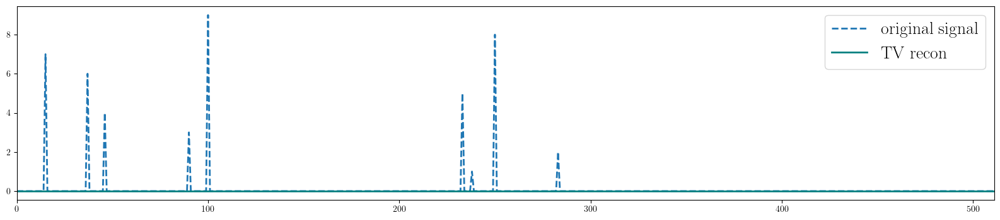

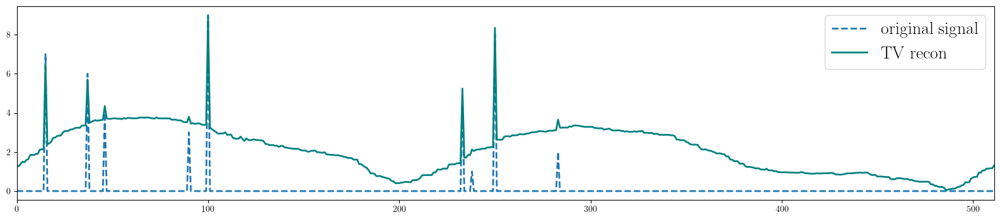

In [107]:
sampling_mask_random = sampling_mask_random > 0
# choose 3 values of lam to show a success case, and two faliure cases where lam is too large or too small
lam_good = 0.01
lam_low = 0.001
lam_high = 5
recon_TV = tv_recon(X[sampling_mask_random], sampling_mask_random, lam=lam_good)
compare_1D_signal(x, np.abs(recon_TV), 'TV recon')
recon_TV = tv_recon(X[sampling_mask_random], sampling_mask_random, lam=lam_high)
compare_1D_signal(x, np.abs(recon_TV), 'TV recon')
recon_TV = tv_recon(X[sampling_mask_random], sampling_mask_random, lam=lam_low)
compare_1D_signal(x, np.abs(recon_TV), 'TV recon')
####################################
########## YOUR CODE HERE ##########
####################################

### 3. Compressive sensing for 2D imaging: extension TV regularization to 2D case
In this part, we will continue to above process but extend from 1D signal to 2D image. We will undersample a phantom image in the k-space (Fourier space), and recover it using 2D TV regularization.

Be careful to the shapes of the images when playing with them. And you should always know the data type of your image as well. So let's first create a function that will be use for sanity check.

In [108]:
# Show image info
def img_info(im):
    # INPUT:
    # im - the image you want to inspect
    # OUTPUT:
    # print type of the argument, data type (dtype) of the argument, smallest pixel value, largest pixel value
    print('type: {}, dtype: {}, shape: {}, min: {}, max: {}'.format(type(im), im.dtype, im.shape, np.min(im), np.max(im)))

# load an image
phantom = shepp_logan_phantom()
# print the info
img_info(phantom)
# you should see the following output to check if you are correct (it doesn't have to be exactly the same format):
# type: <class 'numpy.ndarray'>, dtype: float64, shape: (400, 400), min: 0.0, max: 1.0

type: <class 'numpy.ndarray'>, dtype: float64, shape: (400, 400), min: 0.0, max: 1.0


#### 3.1 Undersampling in k-space

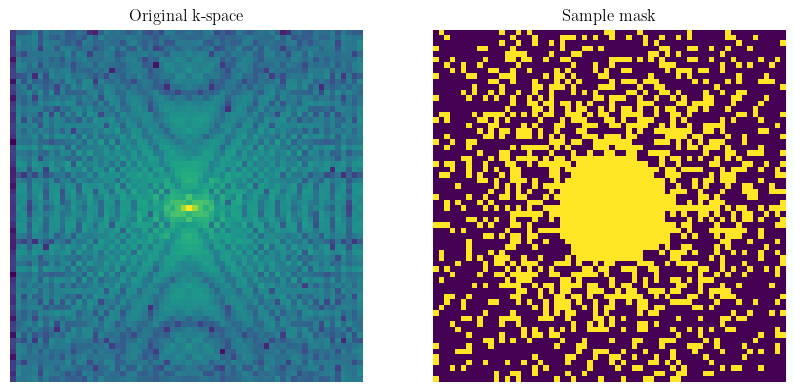

In [109]:
# resize the image to size (64, 64) to accelerate the computation
# Hint: use cv2.resize
phantom = cv2.resize(phantom, (64, 64))
# create mask
mask = np.zeros(phantom.shape, dtype=np.int16)
im_dims = mask.shape
R = 3
n = 0
vardens_factor = 3
while np.prod(im_dims) / (n + 1) > R:
    y, x = np.array(im_dims) // 2
    x += int(np.random.randn(1) * im_dims[1]/vardens_factor)
    y += int(np.random.randn(1) * im_dims[0]/vardens_factor)
    if any((x < 0, y < 0, x >= im_dims[1], y >= im_dims[0])):
        continue
    if mask[x, y] == 0:
        mask[x, y] = 1
        n += 1
# make sure the center part of the k-space is fully sampled
# create a grid
Y, X = np.meshgrid(np.arange(-im_dims[1]//2, im_dims[1]//2), np.arange(-im_dims[0]//2, im_dims[0]//2))
# add all the samples in the centered circle with some radius to the mask
radius = 10
center_samples = X**2 + Y**2 < radius**2
mask += center_samples

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(np.abs(np.fft.fftshift(np.fft.fft2(phantom)))**0.1)
axs[0].axis('off')
axs[0].set_title("Original k-space")
axs[1].imshow(mask > 0, interpolation='none')
axs[1].set_title("Sample mask")
axs[1].axis('off')
plt.show()

#### 3.2 Reconstruction using TV regularization

In [110]:
b = np.fft.fftshift(np.fft.fft2(phantom*100))[mask > 0]
# add noise
noise_factor = 1
b += noise_factor * (np.random.randn(*b.shape) + 1j * np.random.randn(*b.shape))
# zero-filling recon
b_ = np.zeros(im_dims, b.dtype)
b_[mask > 0] = b
B = np.fft.ifft2(np.fft.fftshift(b_))
x = tv_recon_2d(b, mask, 0.1)
x = np.reshape(x, mask.shape)

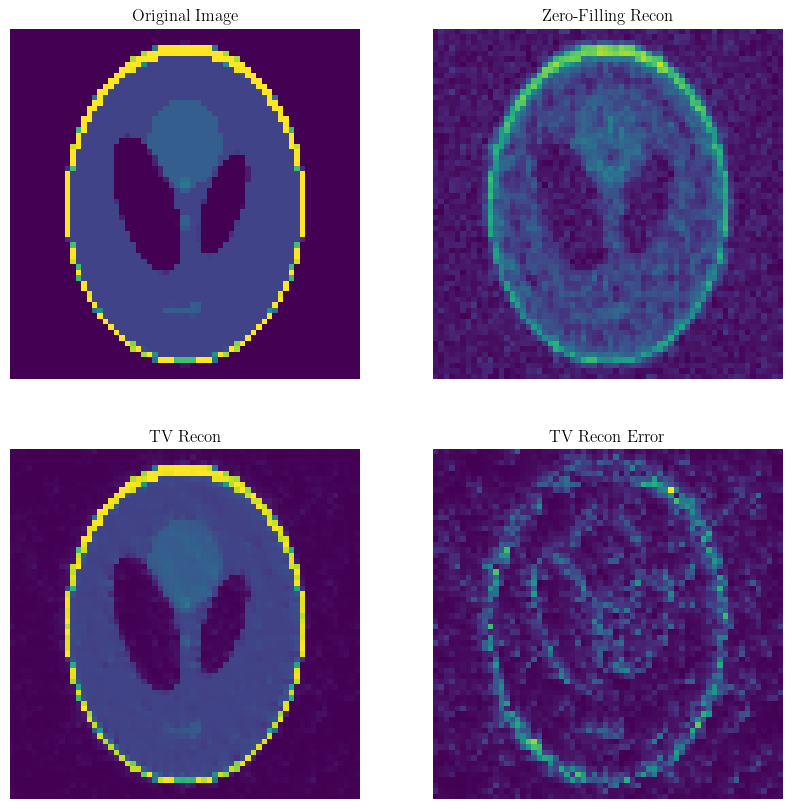

In [111]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].imshow(np.abs(phantom))
axs[0,0].axis('off')
axs[0,0].set_title('Original Image')
axs[0,1].imshow(np.abs(B), vmin=0, vmax=100)
axs[0,1].axis('off')
axs[0,1].set_title('Zero-Filling Recon')
axs[1,0].imshow(np.abs(x), vmin=0, vmax=100)
axs[1,0].axis('off')
axs[1,0].set_title('TV Recon')
axs[1,1].imshow(np.abs(phantom*100 - x))
axs[1,1].axis('off')
axs[1,1].set_title('TV Recon Error')
plt.show()

You should get a much cleaner reconstruction compared to the zero-filling method. The contrasts of the first three images have been set to the same.

### 4. Compressive sensing for 2D imaging: image prior in wavelet domain
In the second demo, we will continue with 2D image. Images are often sparse after transforming it to another domain, which gives hope for reconstruction in the condition of undersampling. For this part, we will get an image first and undersample it in the OBJECT domain to remove some information that we want to use compressive sensing to retrieve.
#### 4.1 Undersampling an image in the object domain

In [112]:
# load an image
image = pywt.data.camera()
# print the info
img_info(image)

type: <class 'numpy.ndarray'>, dtype: uint8, shape: (512, 512), min: 0, max: 255


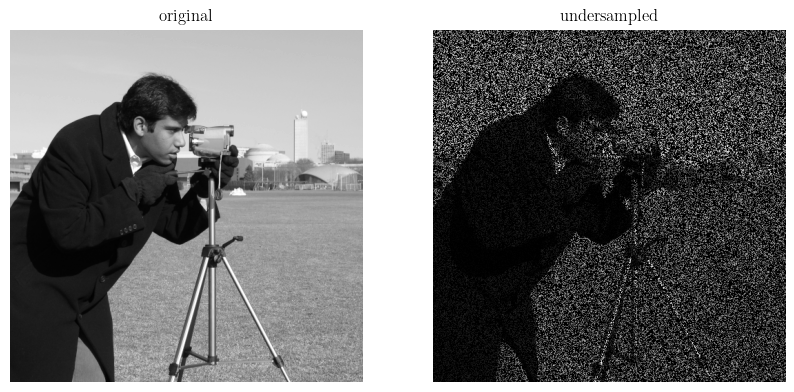

In [114]:
def image_undersampling(img, undersampling_ratio):
    # INPUT:
    # img - ground truth image (size: N*N)
    # undersampling_ratio - only preserve this ratio of pixel value in the ground truth image, so only m = undersampling_ratio*N*N pixels are non-zero
    # OUTPUT:
    # img_undersampled - undersampled image (size: N*N, where m pixels are non-zero)

    # number of total pixels
    n = np.prod(img.shape)
    # number of non-zero pixels
    m = int(undersampling_ratio * n)
    # undersampled image
    img_undersampled = np.zeros((n,))
    # randomly select m pixels from the ground truth image
    # Hint: use np.random.choice
    positions = np.random.choice(n, m, replace=False)
    # assign the pixel values to the undersampled image
    img_undersampled[positions] = img.flatten()[positions]
    # reshape the undersampled image to the original size
    img_undersampled = img_undersampled.reshape(img.shape)

    return img_undersampled

# visualize the undersampling
image_undersampled = image_undersampling(image, undersampling_ratio=0.3)
compare_image(image, image_undersampled, titles=['original', 'undersampled'])

#### 4.2 Image retrieval using prior in wavelet domain
The function below is performing an iterative process: transform the image to the wavelet domain, restore the wavelet domain signal using $\ell_1$ prior, and then transform back to the image domain.

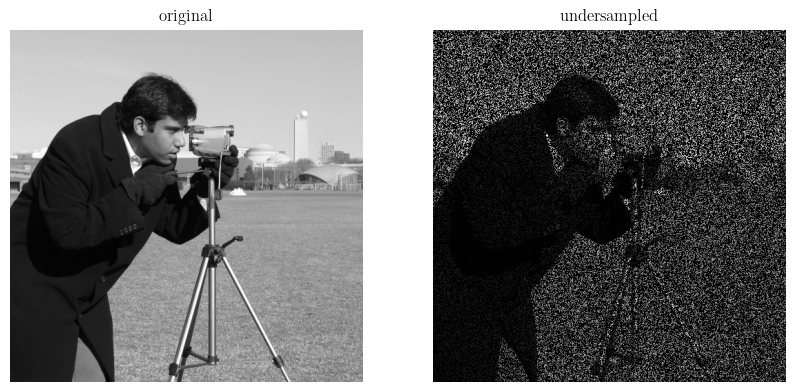

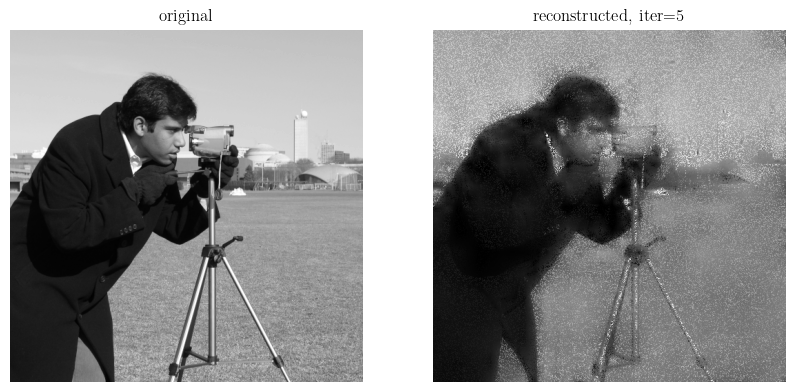

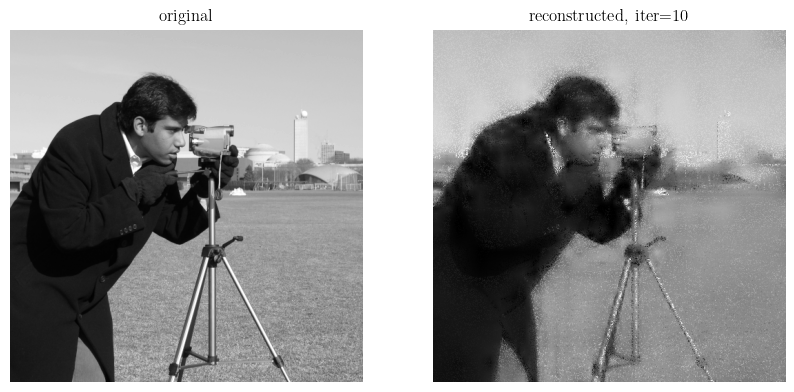

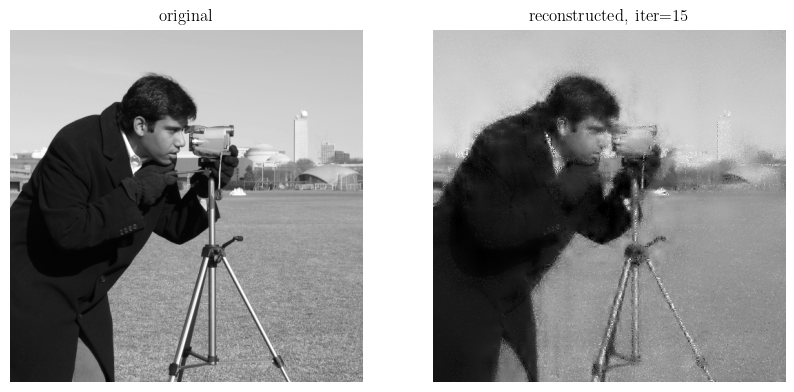

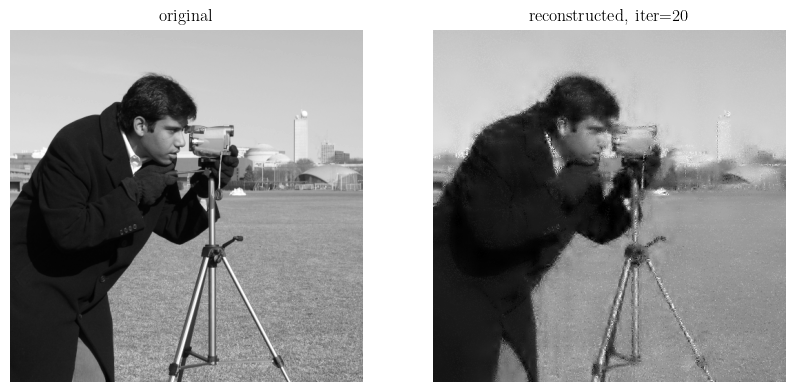

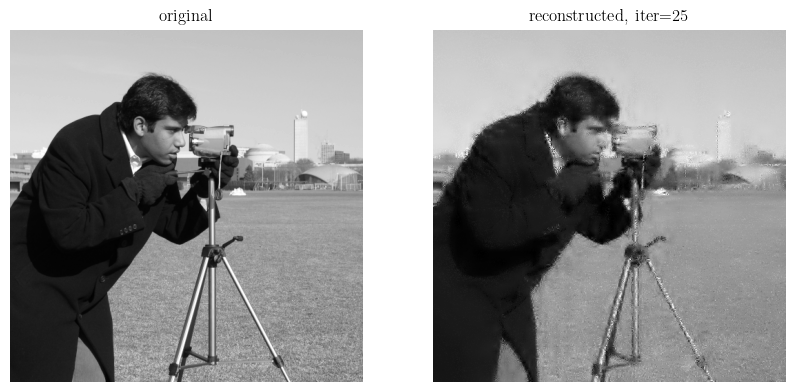

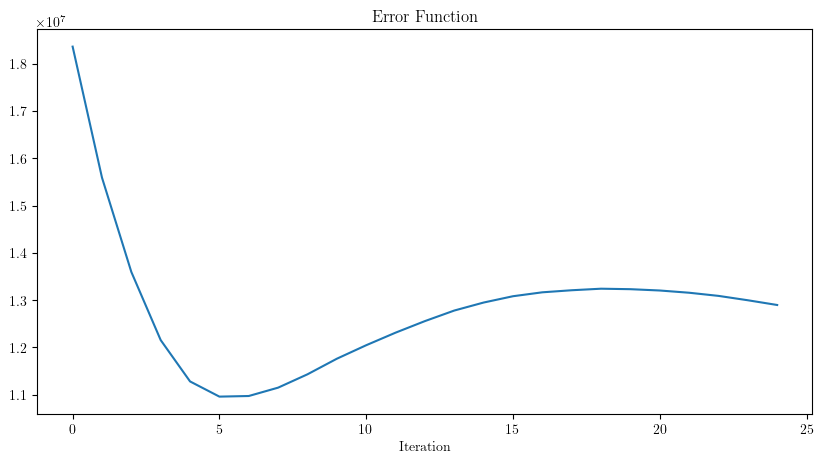

In [140]:
def compressive_sensing(img, undersampling_ratio, iter, lam, lam_decay, error_function, plot_process=False, plot_error=False):
    # INPUT:
    # img - ground truth image
    # undersampling_ratio - same as in image_undersampling
    # iter - number of iterations that alternatingly update the reconstruction
    # lam - same as in recover_l1
    # lam_decay - a decay factor that is applied to lam after each iteration
    # error_function - function that characterizing performance
    # plot_process - plot the reconstruction images as the algorithm iterate if TRUE
    # plot_error - plot the error curve if TRUE
    # OUTPUT:
    # plot reconstructed images and errors

    err = []
    # prepare the undersampled image
    image_undersampled = image_undersampling(img, undersampling_ratio)
    image_reconstructed = image_undersampled.copy()
    if plot_process == True:
        compare_image(img, image_reconstructed, titles=['original', 'undersampled'])
        
    for i in range(iter):
        # use flat_wavelet_transform2 (given in the beginning of the notebook) to transform the image to wavelet domain
        image_reconstructed_transformed = flat_wavelet_transform2(image_reconstructed)
        # use recover_l1 to recover the signal with l1 penalty
        image_reconstructed_transformed_recovered = recover_l1(image_reconstructed_transformed, lam)
        # use inverse_flat_wavelet_transform2 (given in the beginning of the notebook) to transform the image to the original domain
        image_reconstructed = inverse_flat_wavelet_transform2(image_reconstructed_transformed_recovered, image_reconstructed.shape)
        # copy the non-zero pixels in image_undersampled back to image_reconstructed
        image_reconstructed[image_undersampled!=0] = image_undersampled[image_undersampled!=0]
        # clip the image_reconstructed to a matrix that only has integer values between 0 and 255
        image_reconstructed = np.clip(image_reconstructed, 0, 255).astype(np.uint8)
        # append the error using error_function to err (use error_function)
        err.append(error_function(img, image_reconstructed))
        # update lam by multiplying lam_decay
        lam = lam * lam_decay
        # plot comparison using compare_image every 5 iterations
        if (i+1)%5 == 0 and plot_process == True:
            compare_image(img, image_reconstructed, titles=['original', f'reconstructed, iter={i+1}'])

    # plot the reconstruction result
    if plot_process == False:
        plot_reconstruction_results(img, image_undersampled, image_reconstructed)
    # plot the convergence of the error
    if plot_error == True:
        plt.figure(figsize=(10, 5))
        plt.plot(err)
        plt.xlabel('Iteration')
        plt.title('Error Function')
        plt.show()

compressive_sensing(img=image, undersampling_ratio=0.3, iter=25, lam=150, lam_decay=0.9, error_function=l1_error_function, plot_process=True, plot_error=True)

In [ ]:
# Observations:
# 1. Even in the case of extreme undersampling, the reconstructed image is still recognizable.
# 2. For smaller undersampling ratio, the reconstructed image is more blurry and the error function takes more iterations to converge.
# 3. For larger lambda, the error function seems to converge more quickly.
# 4. However, if lambda is increased too high, the error function will seems to plateau at a higher value for several iterations before coming down.
# 5. For smaller lambda, the error function seems to converge faster at first but then plateaus as the decay kicks in.
# 6. When the decay is set too small, the error function actually increases.
# 7. It seems we can still get a good reconstruction faster when using a lambda decay of 1.
# 8. However, in some cases using a lambda decay of 1 causes the error function to converge prematurely.
# 9. The error function doesn't always go down monotonically. Sometimes it goes up a little bit before going down again.
# 10. Sometimes the visual image quality doesn't correlate exactly with the error function, or at least it isn't as noticeable as the error function seems to make it out to be.
# 11. Whenever the error fucntion is minimized doesn't always correspond to the best visual image quality subjectively.

You should be able to see the reconstruction image is getting clearer and the error function is converging. This is a checkpoint for you to make sure all your codes are working! Finally, play with the parameters and write down your observations.

Hint:
1. You might need to set the flag of <code>plot_process</code> and/or <code>plot_error</code> to <code>TRUE</code> for demonstration
2. As a control experiment, try to only change one parameter at one time

#### 4.3 Test with different settings

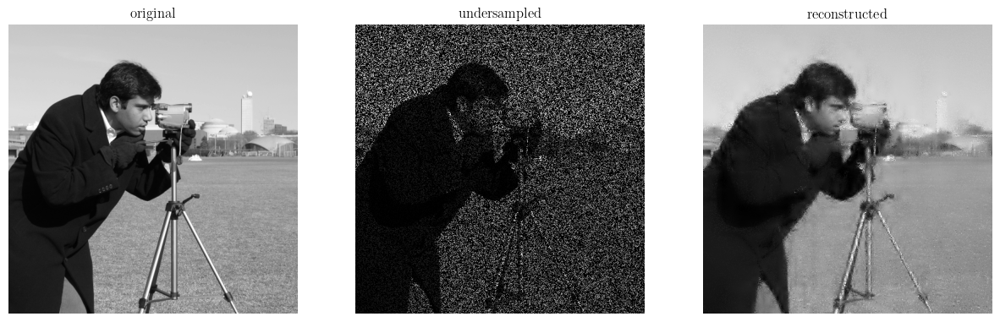

In [141]:
# normal setting
compressive_sensing(img=image, undersampling_ratio=0.3, iter=20, lam=150, lam_decay=0.9, error_function=l1_error_function)

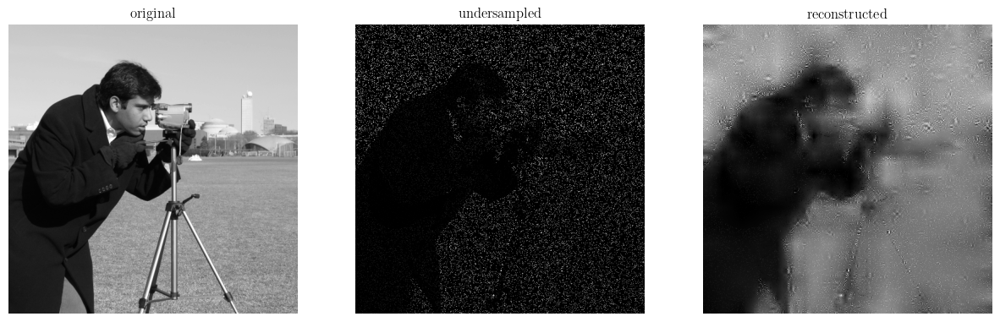

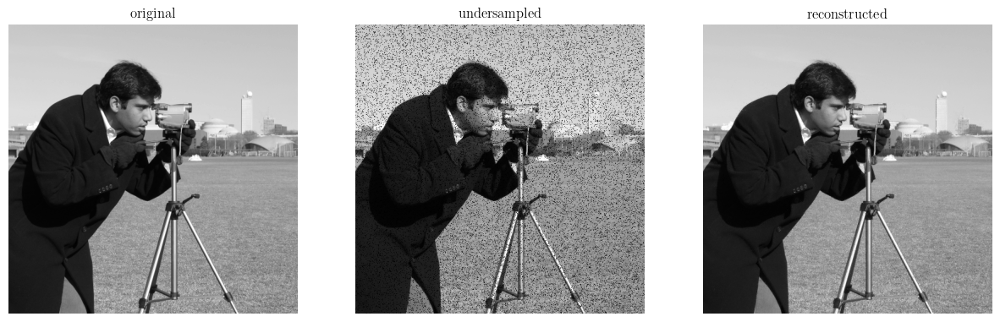

In [142]:
# what will happen if undersampling_ratio is very high/low
compressive_sensing(img=image, undersampling_ratio=0.1, iter=20, lam=150, lam_decay=0.9, error_function=l1_error_function)
compressive_sensing(img=image, undersampling_ratio=0.9, iter=20, lam=150, lam_decay=0.9, error_function=l1_error_function)


# Observations:
# 1. When undersampling_ratio is very low, the reconstructed image is recognizable but very blurry.
# 2. When undersampling_ratio is very high, the reconstructed image is very close to the original and almost all of the noise is gone.

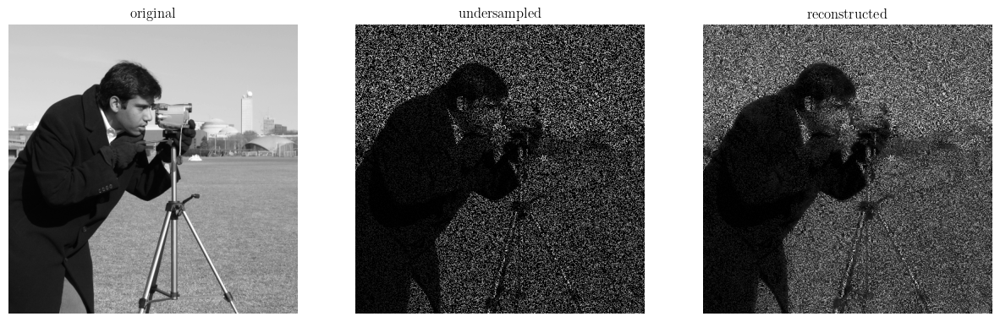

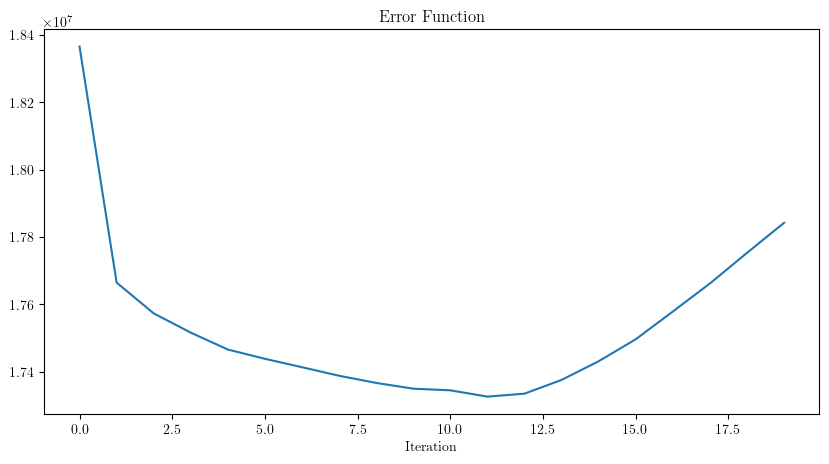

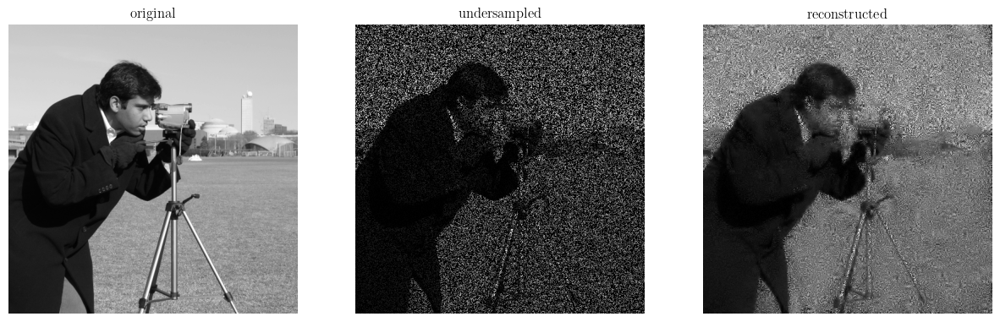

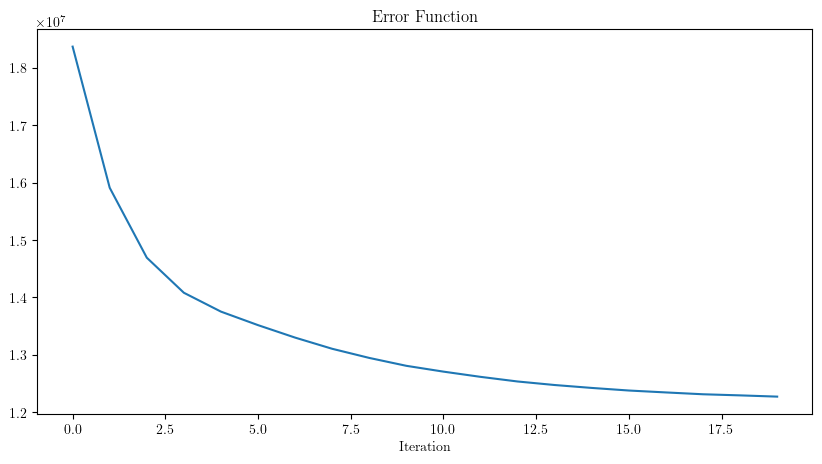

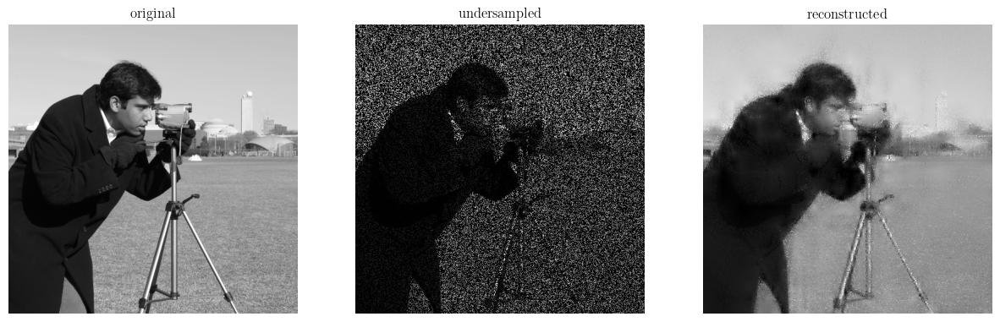

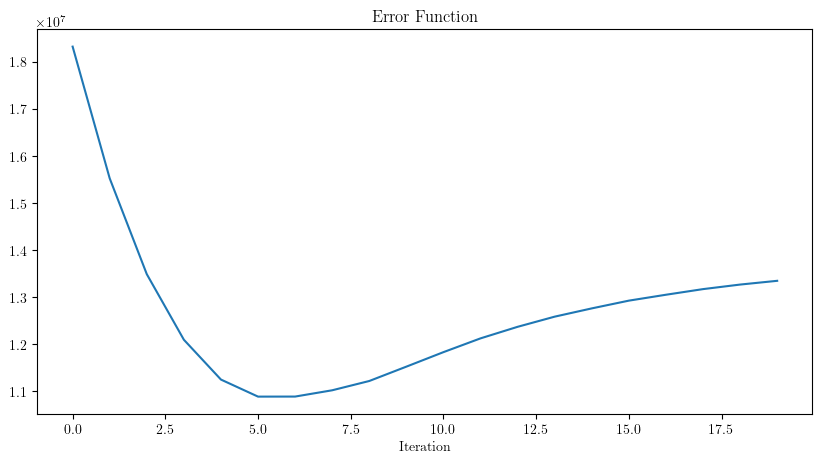

In [146]:
# what will happen if small/large lam_decay is used
compressive_sensing(img=image, undersampling_ratio=0.3, iter=20, lam=150, lam_decay=0.1, error_function=l1_error_function, plot_error=True)
compressive_sensing(img=image, undersampling_ratio=0.3, iter=20, lam=150, lam_decay=0.5, error_function=l1_error_function, plot_error=True)
compressive_sensing(img=image, undersampling_ratio=0.3, iter=20, lam=150, lam_decay=0.95, error_function=l1_error_function, plot_error=True)

# Observations:
# 1. We can see that as the decay factor gets smaller, the reconstructed image quality gets worse.
# 2. When the decay factor is large, the reconstruction quality seems to be optimal.

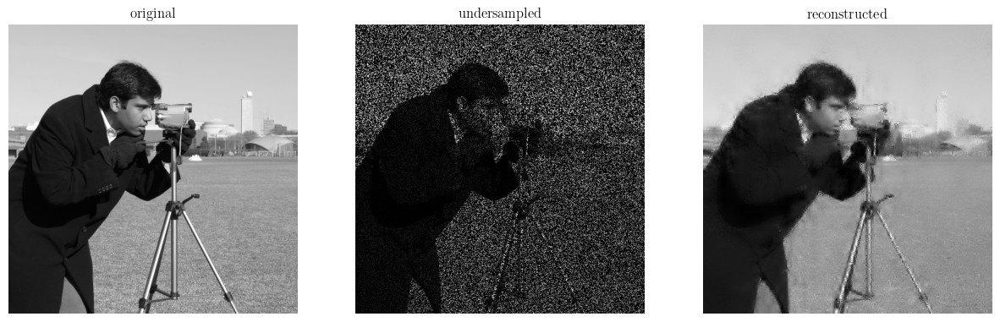

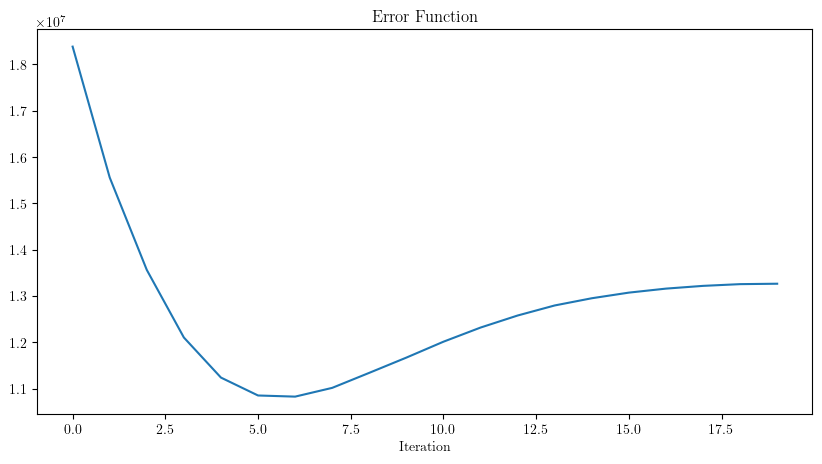

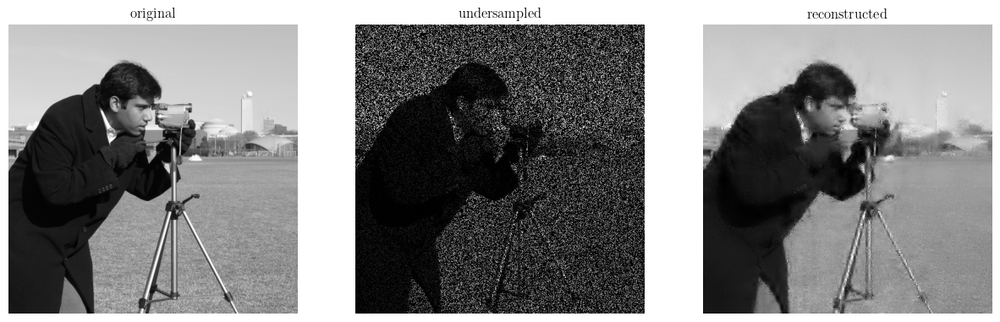

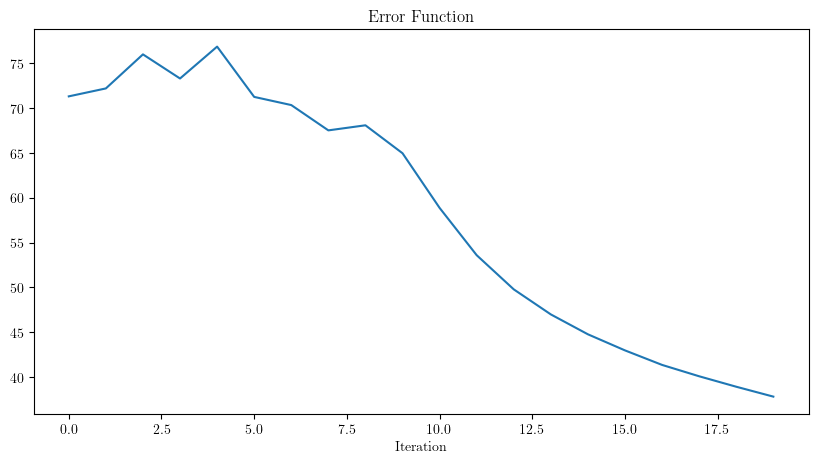

In [148]:
# is the tendency of fidelity consistent if another metric is used for characterization (e.g., l2 error, PSNR, SSIM)
def MSE(img1, img2):
    # img1 - ground truth
    # img2 - reconstructed image
    my_metric = np.mean((img1 - img2)**2)
    return my_metric

compressive_sensing(img=image, undersampling_ratio=0.3, iter=20, lam=150, lam_decay=0.9, error_function=l1_error_function, plot_error=True)
compressive_sensing(img=image, undersampling_ratio=0.3, iter=20, lam=150, lam_decay=0.9, error_function=MSE, plot_error=True)

# Observations:
# 1. We see that MSE better corresponds to the visual image quality than L1 error for this example.
# 2. In the case of L1 error, the error plot seems to imply that the image quality gets worse as the iterations go on, but in reality the image reconstruction quality is actually getting better.

The last problem: we will move back to the phantom image. Is our algorithm generalizable? Change the parameters until you are satisfied with the reconstruction (<code>undersampling_ratio=0.3</code>). Are the parameters the same as the ones you use to reconstruct the cameraman image? Visualize the reconstruction and write down your observations.

type: <class 'numpy.ndarray'>, dtype: uint8, shape: (512, 512), min: 0, max: 255


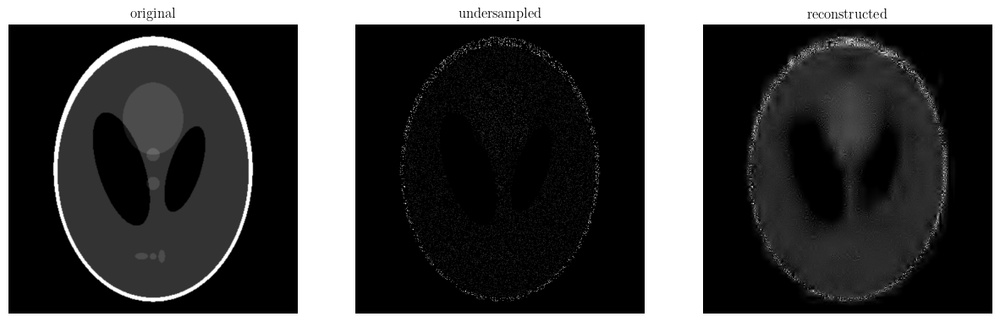

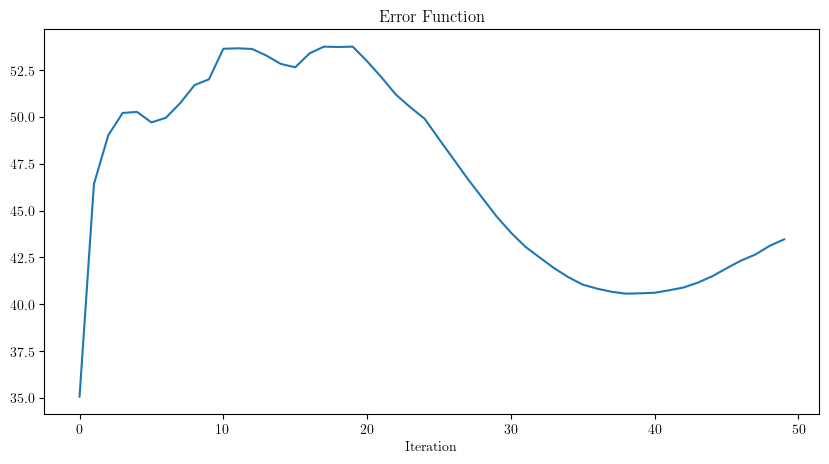

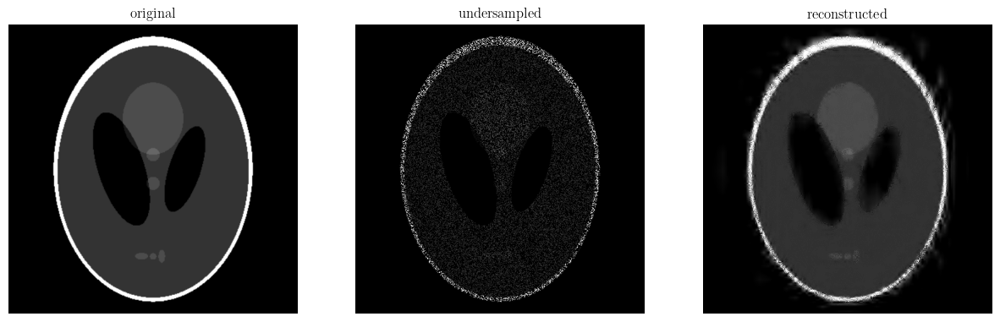

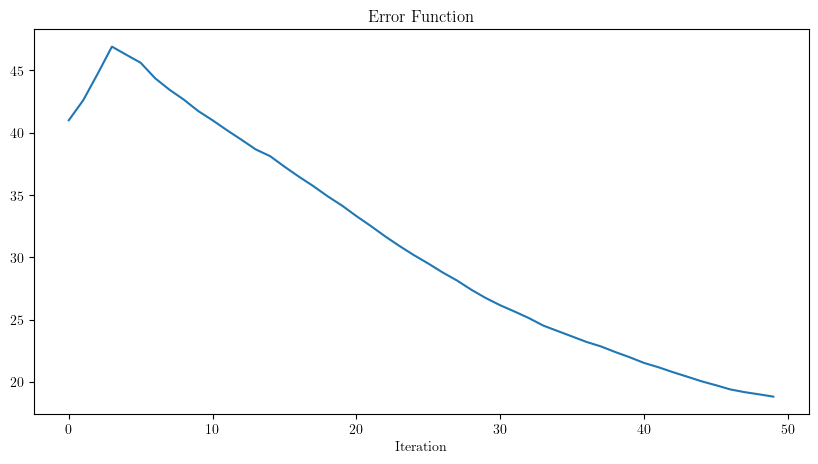

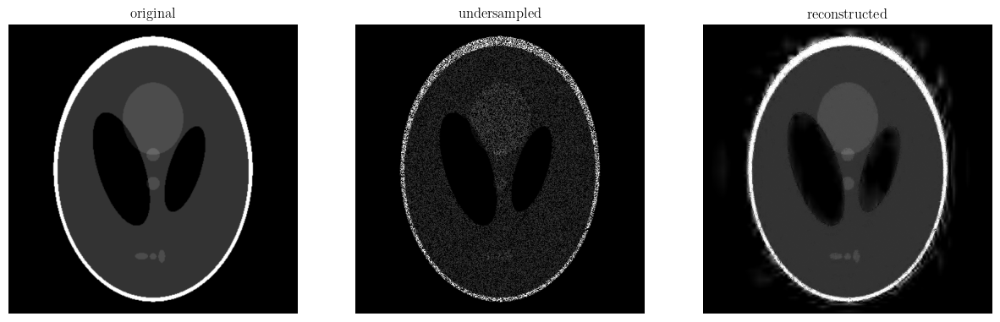

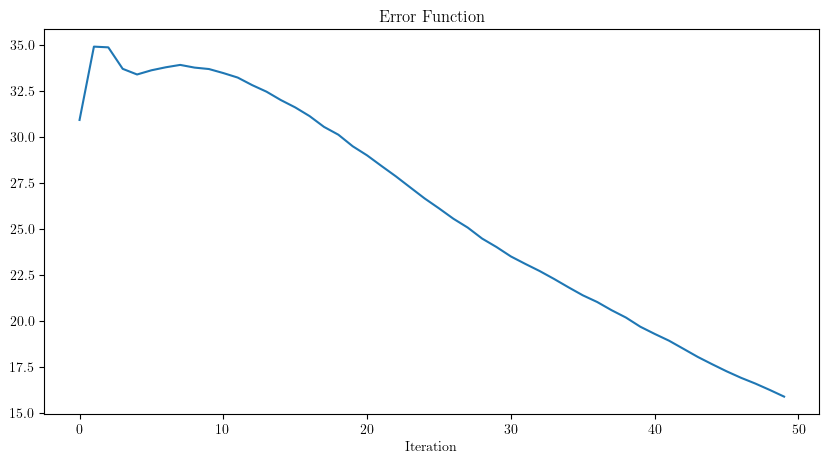

In [161]:
# can this method be applied to other images and do we need to change the parameters for good performance
# prepare image
phantom = shepp_logan_phantom()
# change phantom to a matrix with values between 0-255 with size (512, 512)
phantom = cv2.resize(phantom, (512, 512)) * 255
# change phantom to uint8
phantom = phantom.astype(np.uint8)
img_info(phantom)
# define hyperparameters
lam_decay = 0.9
num_iter = 50

compressive_sensing(img=phantom, undersampling_ratio=0.1, iter=num_iter, lam=150, lam_decay=lam_decay, error_function=MSE, plot_error=True)
compressive_sensing(img=phantom, undersampling_ratio=0.3, iter=num_iter, lam=150, lam_decay=lam_decay, error_function=MSE, plot_error=True)
compressive_sensing(img=phantom, undersampling_ratio=0.5, iter=num_iter, lam=150, lam_decay=lam_decay, error_function=MSE, plot_error=True)

# Observations:
# 1. Even using the phantom image, we see that the algorithm is able to reconstruct the undersampled image with a high degree of accuracy.
# 2. As a function of undersampling ratio, the reconstructed image quality increases with higher undersampling ratios, as expected.
# 3. For an undersampling ratio of 0.3, the reconstructed image is fairly close to the original image.
# 4. The reconstruction quality as a function of undersampling ratio behaves similarly to the previous pedogagical example.
# 5. The reconstruction algorithm is not stochastic. If you run it with the same hyperparameters, you will get the same convergence behavior every time.